### A siamese nueral network that predicts if two images are of the same place or not.

In [1]:
import numpy as np
import tensorflow as tf
import tensorflow_addons as tfa
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow import keras
import os
from pathlib import Path
import random
from sklearn.model_selection import train_test_split

cd = Path.cwd()
folder_path = os.path.join(cd,'OneDrive\Desktop\Datasets\location-images')
places = os.listdir(folder_path)
places = sorted(places)
print('Names of the sites included in the dataset:\n')
for place in places:
    print(place)

Names of the sites included in the dataset:

brandenburg_gate
british_museum
buckingham_palace
colosseum_exterior
grand_place_brussels
lincoln_memorial_statue
notre_dame_front_facade
pantheon_exterior
piazza_san_marco
sacre_coeur
sagrada_familia
st_pauls_cathedral
st_peters_square
taj_mahal
temple_nara_japan
trevi_fountain


In [2]:
filepaths = []
labels = []

for place in places:
    full_label_path = os.path.join(folder_path,place,'images')
    images_list = os.listdir(full_label_path)
    images_list = sorted(images_list)
    for image_path in images_list:
        filepaths.append(os.path.join(full_label_path,image_path))
        labels.append(places.index(place))
filepaths = np.array(filepaths)
labels = np.array(labels)

train_paths,test_paths,train_labels,test_labels = train_test_split(filepaths,labels,test_size=.05,random_state=0)

In [3]:
height = 512
width = 512

def process_image(path,label,dtype=tf.float32):
    image = tf.io.read_file(path)
    image = tf.io.decode_image(image,expand_animations=False)
    image = tf.image.convert_image_dtype(image,dtype)
    image = tf.image.resize(image,(height,width))
    return image,label

batch_size = 64
def make_dataset(X,y,train=True):
    dataset = tf.data.Dataset.from_tensor_slices((X,y))
    dataset = dataset.map(process_image)
    if train:
        dataset = dataset.map(lambda image,label: (tf.image.random_flip_left_right(image),label))
        dataset = dataset.shuffle(batch_size*10)
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

train_dataset = make_dataset(train_paths,train_labels)
test_dataset = make_dataset(test_paths,test_labels,train=False)

### The model starts with a series of convolutional blocs (including convolutional, maxpool, and batch normalization layers), which is the flattened and fed into dense layers. The final dense layer is the output, which encodes each image in a 500-dimensional vector. 
### The model is optimized using triplet loss, which takes the input image (the "anchor"), a positive image (one with the same class as the anchor) and a negative image (one of a different class.) The loss function takes the Euclidean distance between the anchor and the positive image as well as between the anchor and the negative image, and attemps to minimize the former and maximize that latter.

In [4]:
num_filters = 16

siamese_model_input = keras.Input(shape=(height,width,3))
X = siamese_model_input
for i in range(6):
    filters = num_filters*(2**i)
    X = keras.layers.Conv2D(filters,(3,3),activation='relu')(X)
    X = keras.layers.MaxPooling2D(2)(X)
    X = keras.layers.BatchNormalization()(X)
X = keras.layers.Conv2D(num_filters*(2**7),(3,3),activation='relu')(X)
X = keras.layers.MaxPooling2D(2)(X)
X = keras.layers.BatchNormalization()(X)
X = keras.layers.Flatten()(X)
X = keras.layers.Dense(500,activation='relu')(X)
X = keras.layers.BatchNormalization()(X)
siamese_model_output = keras.layers.Dense(500,activation='tanh')(X)

siamese_model = keras.Model(inputs=siamese_model_input,
                           outputs=siamese_model_output)

siamese_model.compile(optimizer='adam',
                     loss=tfa.losses.TripletSemiHardLoss())

siamese_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 512, 512, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 510, 510, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 255, 255, 16)     0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 255, 255, 16)     64        
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 253, 253, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 126, 126, 32)     0     

### The model was trained on a GPU for 50 epochs. The weights were then downloaded and uploaded here.
### Here are the final loss values of the model on the training images and the test images:

In [5]:
weights_path = os.path.join(cd,'OneDrive\Desktop\Datasets\weights\siamese-model-weights.h5')
siamese_model.load_weights(weights_path)

train_dataset_sample = make_dataset(train_paths[:500],train_labels[:500],train=False)
loss = siamese_model.evaluate(train_dataset_sample)
test_loss = siamese_model.evaluate(test_dataset)

print('\nLoss on train data:',round(loss,4))
print('Loss on test data:',round(test_loss,4))

5/5 [==============================] - 16s 3s/step - loss: 0.0194

Loss on train data: 0.0002
Loss on test data: 0.0194


### The following functions are used to take pairs of images known to either be of the same place or not to be, use the model to embed them in output vectors, and calculate the distance between the two vectors ("distance between images" refers to the Euclidean distance between the embedding vectors of two images.)

In [6]:
euclidean_distance = lambda a,b: np.sqrt(np.sum(np.square(a-b)))

def similar_image_pair(place_label,path_list,label_list):
    
    indices = np.where(label_list==place_label)[0]
    sample_indices = np.random.choice(indices,2)
    path1,path2 = path_list[sample_indices]
    
    image1 = process_image(path1,_)[0]
    image2 = process_image(path2,_)[0]
    embedding1,embedding2 = siamese_model.predict(np.array([image1,image2]))
    distance = euclidean_distance(embedding1,embedding2)
    
    return image1,image2,distance


def different_image_pair(path_list,label_list):
    
    label1,label2 = random.sample(list(np.unique(labels)),2)
    
    indices1 = np.where(label_list==label1)[0]
    path1 = path_list[np.random.choice(indices1)]
    image1 = process_image(path1,_)[0]
    
    indices2 = np.where(label_list==label2)[0]
    path2 = path_list[np.random.choice(indices2)]
    image2 = process_image(path2,_)[0]
    
    embedding1,embedding2 = siamese_model(np.array([image1,image2]))
    distance = euclidean_distance(embedding1,embedding2)
    
    return label1,image1,label2,image2,distance

### Examples of pairs of images of the same place (notice the distance is relatively small):

Simiar images:

brandenburg_gate
Distance between images: 10.344441


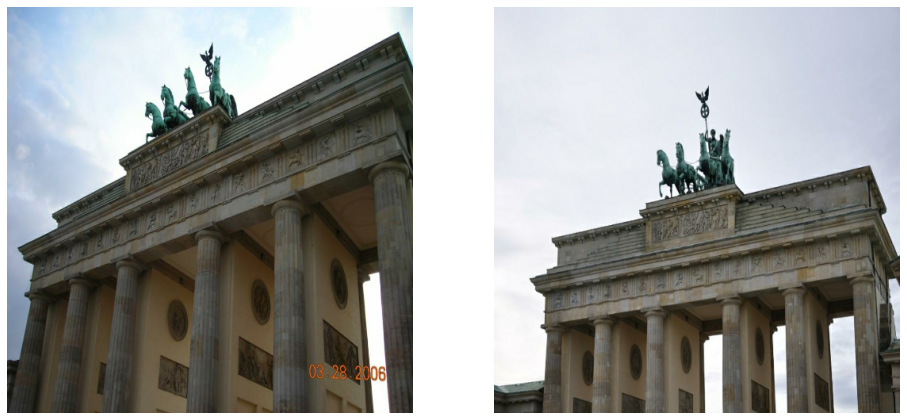


temple_nara_japan
Distance between images: 9.550563


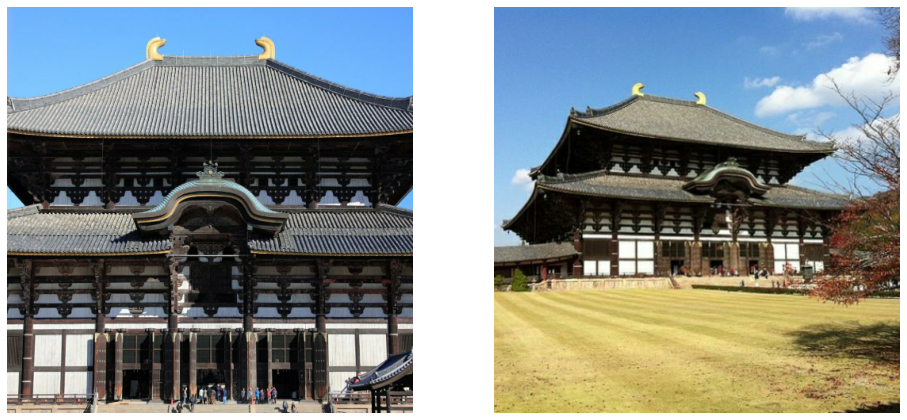


st_pauls_cathedral
Distance between images: 10.624626


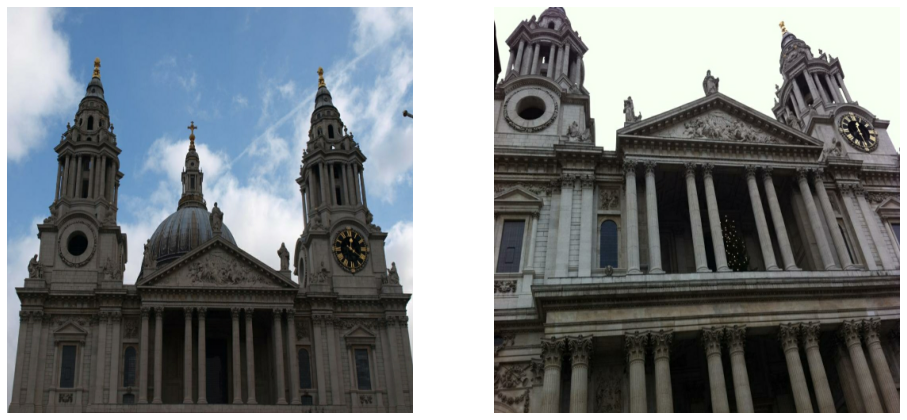


british_museum
Distance between images: 11.600807


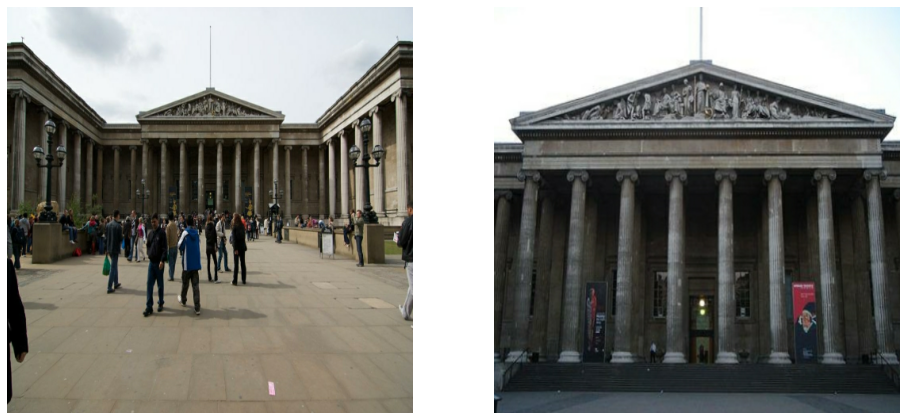

In [7]:
print('Simiar images:\n')

for i in range(4):
    random_label = random.randint(0,15)
    image1,image2,distance = similar_image_pair(random_label,train_paths,train_labels)
    print(places[random_label])
    print('Distance between images:',distance)
    plt.figure(figsize=(16,8))
    plt.subplot(1,2,1)
    plt.imshow(image1)
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(image2)
    plt.axis('off')
    plt.show()
    print()

### Examples of pairs of images of different places (notice how to distance is larger):

Different images:

Distance between images: 31.585848


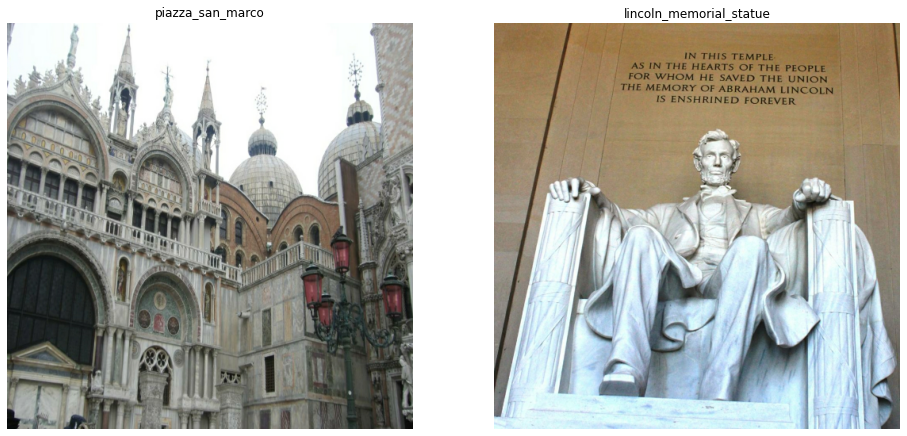

Distance between images: 35.28023


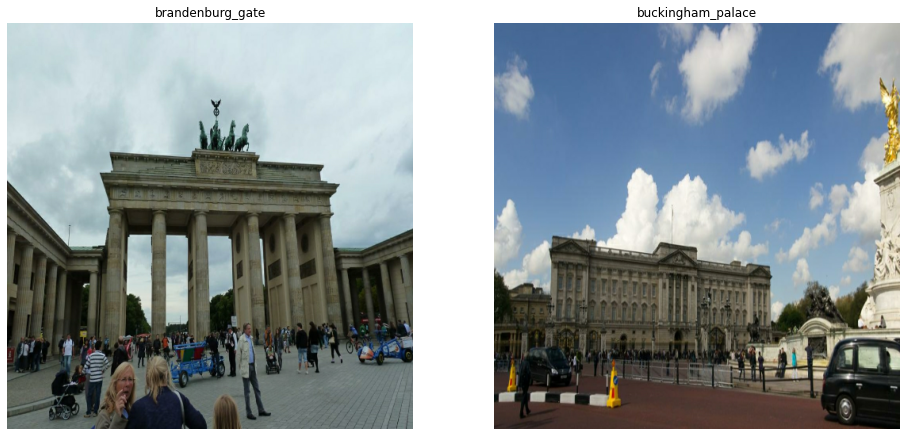

Distance between images: 27.488686


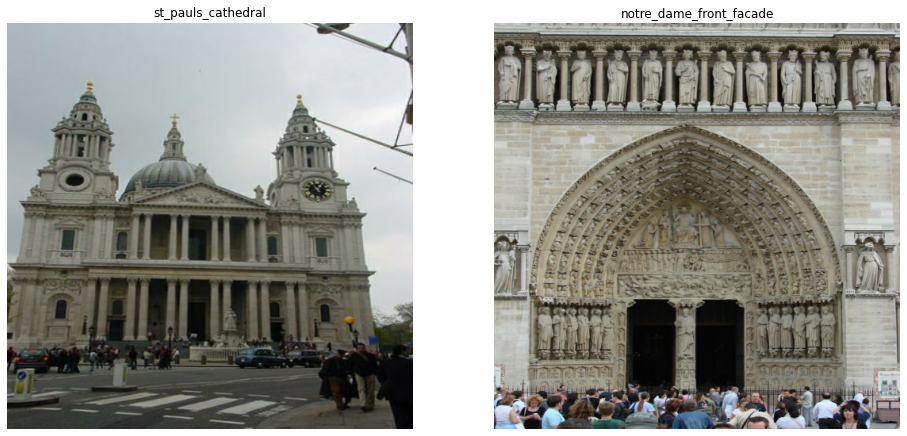

Distance between images: 33.381638


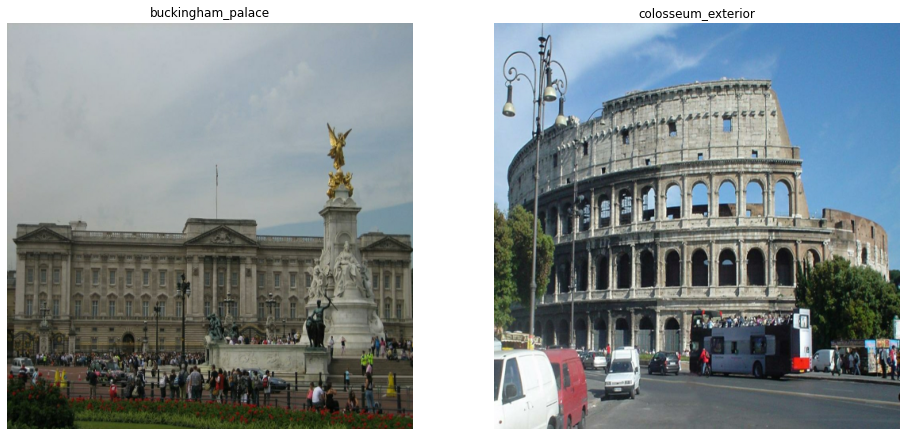

In [8]:
print('Different images:\n')

for i in range(4):
    label1,image1,label2,image2,distance = different_image_pair(train_paths,train_labels)
    print('Distance between images:',distance)
    plt.figure(figsize=(16,8))
    plt.subplot(1,2,1)
    plt.imshow(image1)
    plt.title(places[label1])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(image2)
    plt.title(places[label2])
    plt.axis('off')
    plt.show()

### In order to use the model to predict whether or not two images are of the same place, a "cutoff point" must be determined; any pair with a distance lower than that point are assumed to be similar, and any pair with a larger distance are assumed to be different. This number is calculated based on the distances between images of a large sample of pairs. The cutoff point is the mean of the means of distances of similar images and of dissimilar images.

In [9]:
similar_image_distances = []
different_image_distances = []

for i in range(1600):
    pick = random.choice(['same','different'])
    if pick == 'same':
        label_num = random.choice(labels)
        image1,image2,distance = similar_image_pair(label_num,train_paths,train_labels)
        similar_image_distances.append(distance)
    elif pick == 'different':
        label1,image1,label2,image2,distance = different_image_pair(train_paths,train_labels)
        different_image_distances.append(distance)
        
similar_image_distances = np.array(similar_image_distances)
different_image_distances = np.array(different_image_distances)

cutoff_point = (similar_image_distances.max() + different_image_distances.min())/2

print('Decision cutoff point:',cutoff_point)

def test_random_images(path_list,label_list,cutoff_point=cutoff_point):
    
    pick = random.choice(['same','different'])
    if pick == 'same':
        label_num = random.choice(labels)
        label1 = label_num
        label2 = label_num
        image1,image2,distance = similar_image_pair(label_num,path_list,label_list)
        
    elif pick == 'different':
        label1,image1,label2,image2,distance = different_image_pair(path_list,label_list)
        
    if distance <= cutoff_point:
        pred = True
    elif distance >= cutoff_point:
        pred = False
        
    return image1,label1,image2,label2,distance,pred

Decision cutoff point: 18.667129516601562


### Finaly, the model is tested. Below is the model's accuracy, followed by examples of image pairs with predictions.

Testing the model...
After being tested on 200 pairs of images from the test data, the model is 99.0% accurate.


These images are of different places.
These image are predicted to be of different places.

Distance between the images: 35.18557


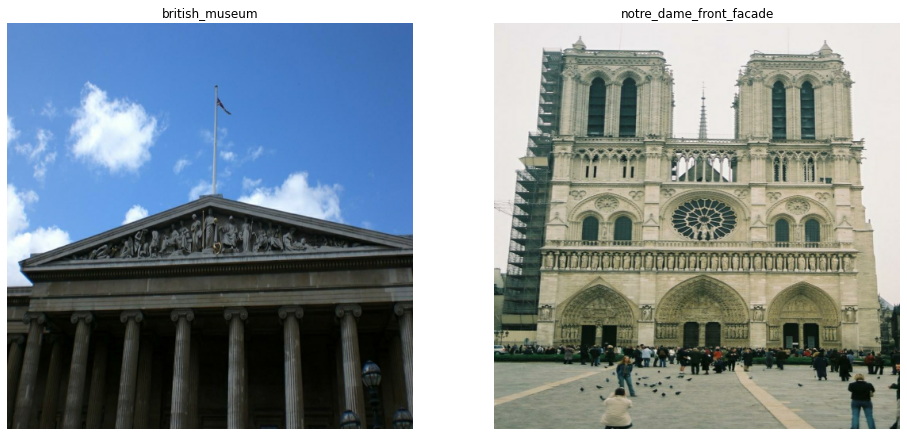


These images are of different places.
These image are predicted to be of different places.

Distance between the images: 36.325237


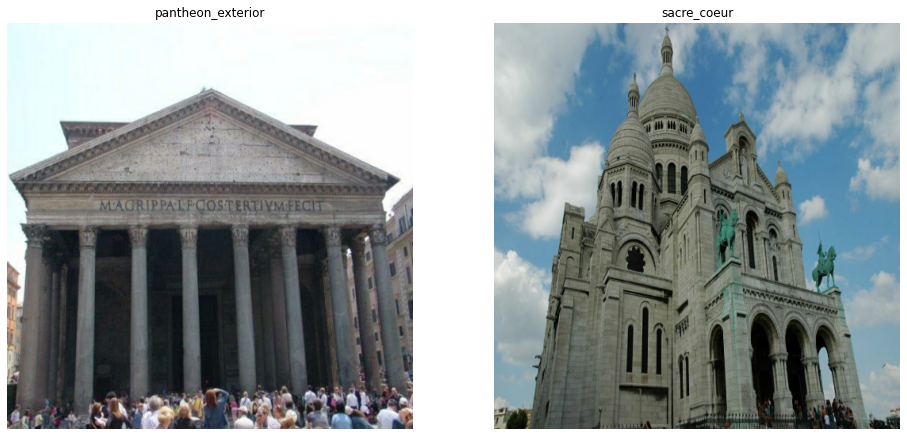


These images are of the same place.
These image are predicted to be of different places.

Distance between the images: 19.908436


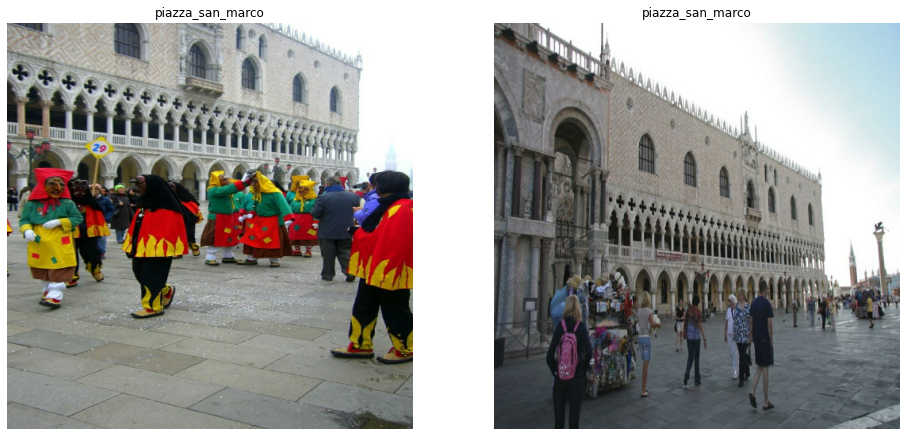


These images are of the same place.
These images are predicted to be of the same place.

Distance between the images: 6.2063484


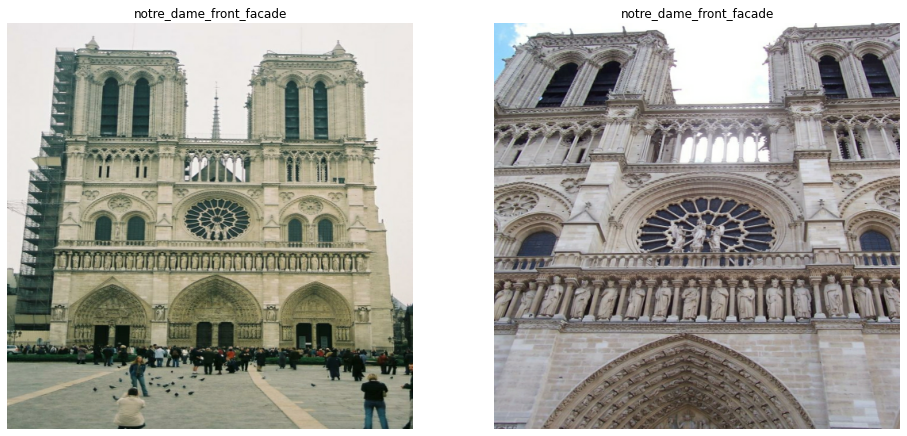


These images are of different places.
These image are predicted to be of different places.

Distance between the images: 25.369707


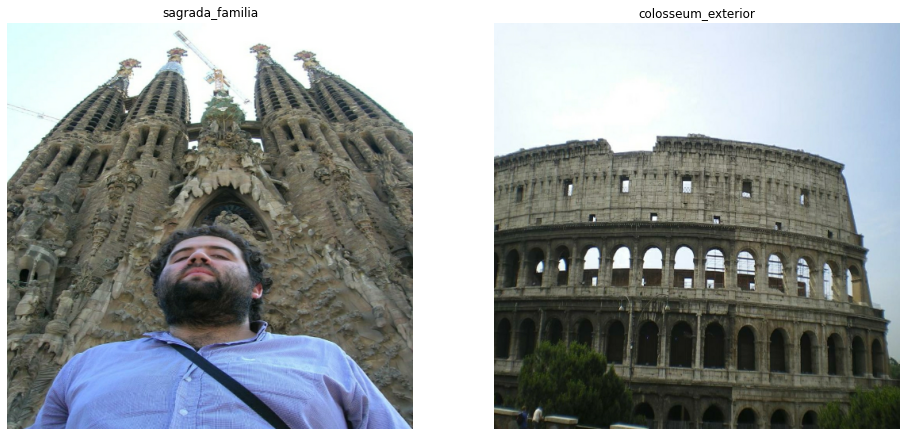


These images are of different places.
These image are predicted to be of different places.

Distance between the images: 30.389862


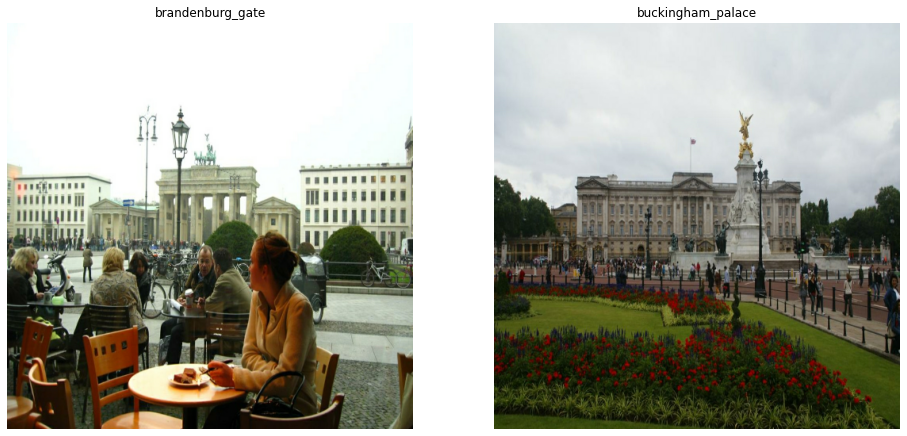


These images are of the same place.
These images are predicted to be of the same place.

Distance between the images: 3.1811082


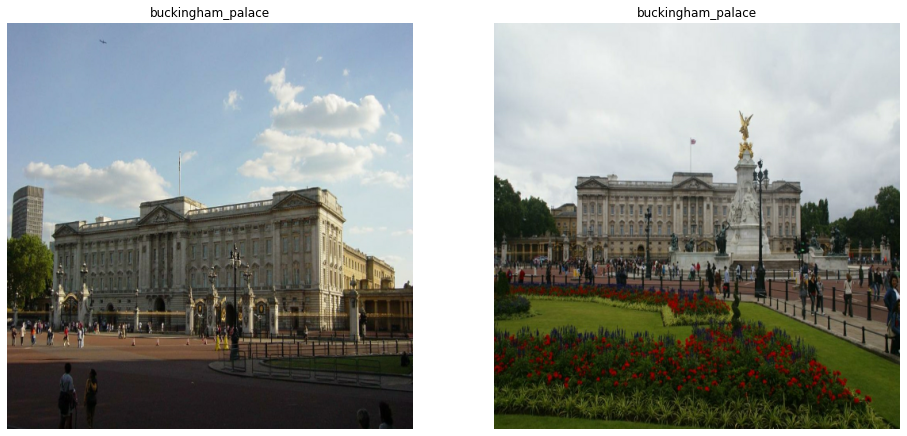


These images are of different places.
These image are predicted to be of different places.

Distance between the images: 25.10803


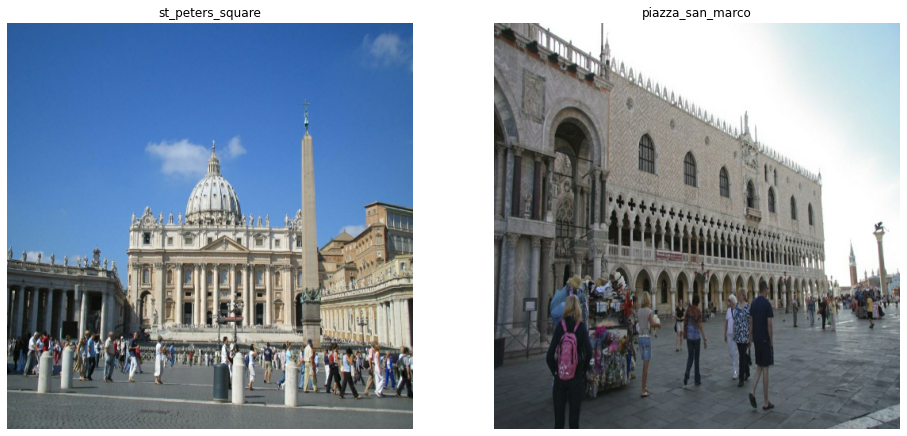


These images are of the same place.
These images are predicted to be of the same place.

Distance between the images: 7.5173454


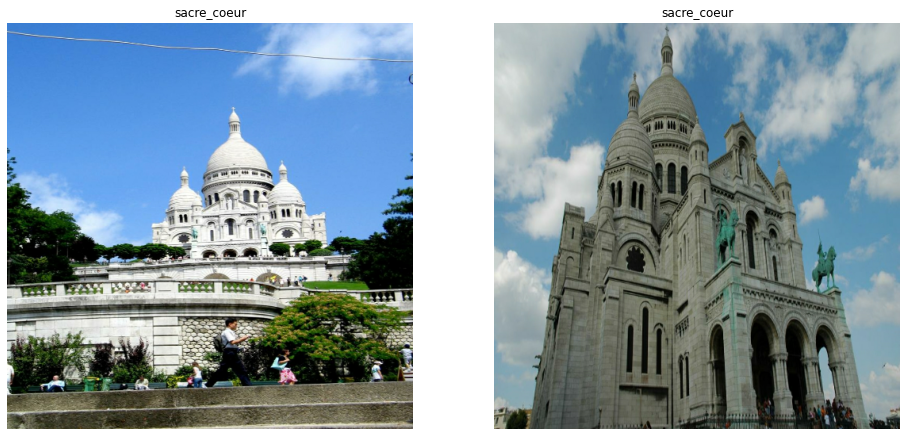


These images are of different places.
These image are predicted to be of different places.

Distance between the images: 30.118235


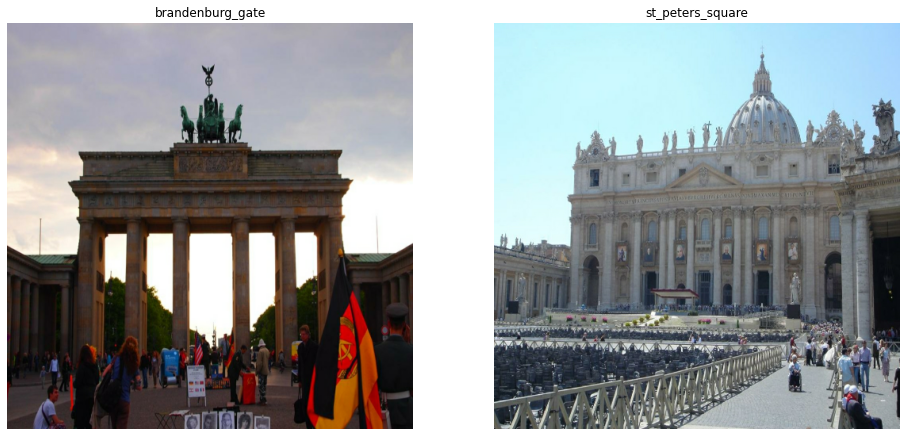


These images are of the same place.
These images are predicted to be of the same place.

Distance between the images: 4.2873797


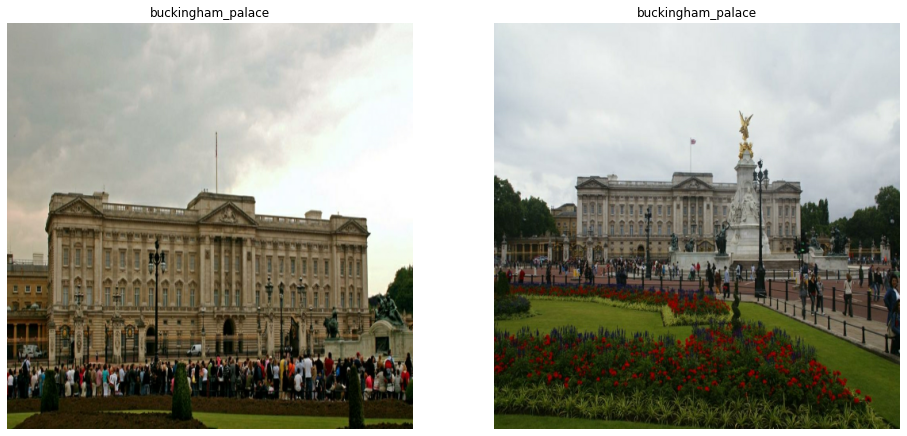


These images are of different places.
These image are predicted to be of different places.

Distance between the images: 32.741467


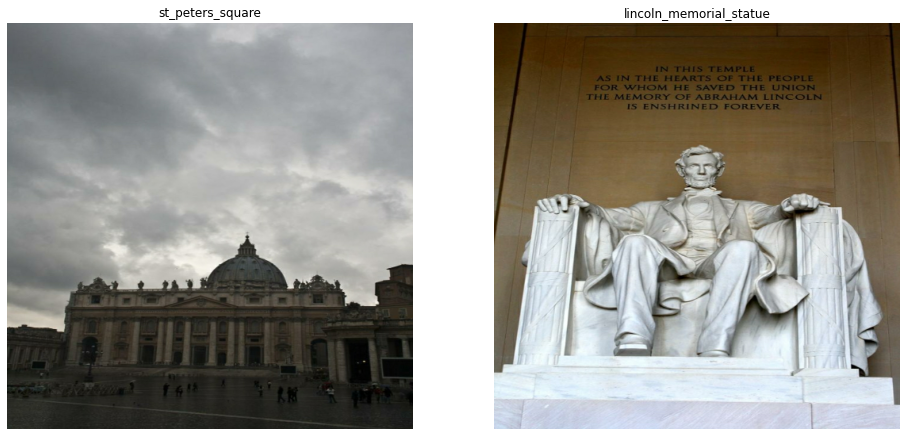


These images are of different places.
These image are predicted to be of different places.

Distance between the images: 25.978678


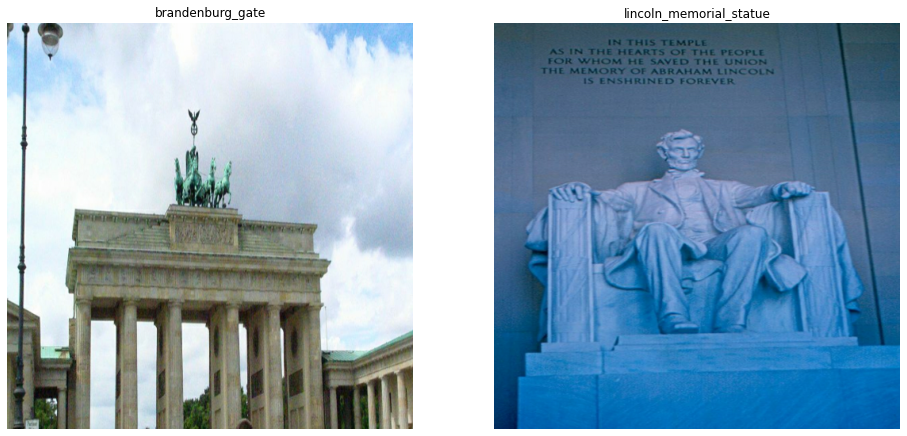


These images are of the same place.
These images are predicted to be of the same place.

Distance between the images: 8.820565


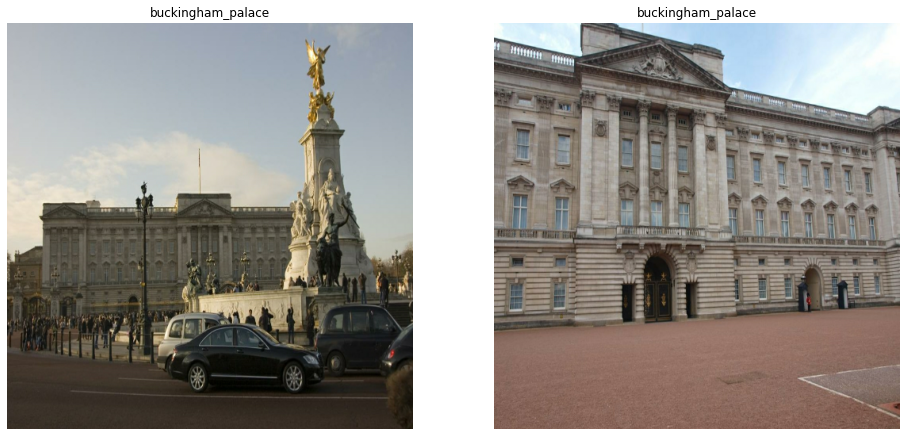


These images are of different places.
These image are predicted to be of different places.

Distance between the images: 29.072966


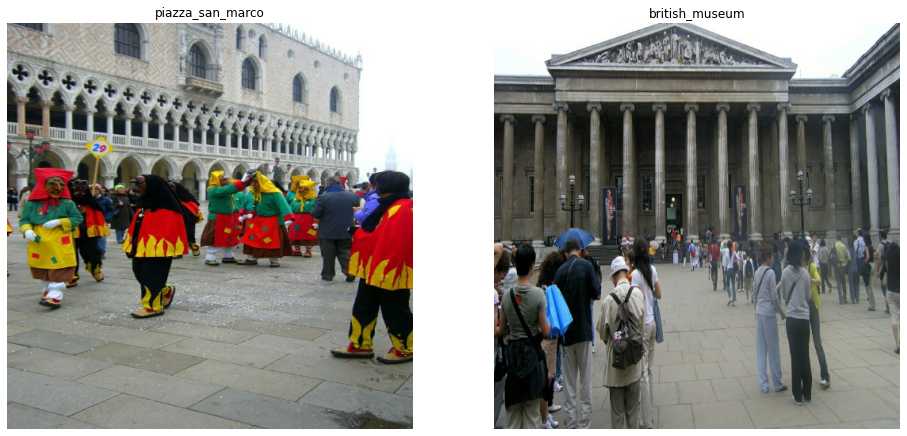


These images are of the same place.
These images are predicted to be of the same place.

Distance between the images: 2.8370373


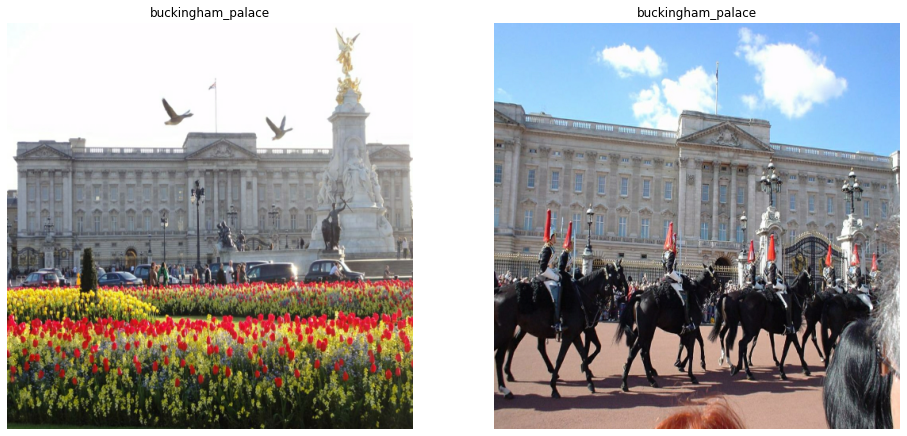

In [10]:
print('Testing the model...')

correct = 0
num_to_test = 200
for i in range(num_to_test):
    image1,label1,image2,label2,distance,pred = test_random_images(test_paths,test_labels)
    is_same = label1 == label2
    if pred == is_same:
        correct += 1
accuracy = correct/num_to_test
accuracy = round(accuracy*100,1)
print('After being tested on {} pairs of images from the test data, the model is {}% accurate.\n'.format(num_to_test,
                                                                                                        accuracy))


for i in range(16):
    image1,label1,image2,label2,distance,pred = test_random_images(test_paths,test_labels)
    if label1 == label2:
        print('\nThese images are of the same place.')
    elif label1 != label2:
        print('\nThese images are of different places.')
    if pred:
        print('These images are predicted to be of the same place.')
    else:
        print('These image are predicted to be of different places.')
    print("\nDistance between the images:",distance)
    plt.figure(figsize=(16,8))
    plt.subplot(1,2,1)
    plt.imshow(image1)
    plt.axis('off')
    plt.title(places[label1])
    plt.subplot(1,2,2)
    plt.imshow(image2)
    plt.axis('off')
    plt.title(places[label2])
    plt.show()